# Plotting the average pairwise coalescence times between species across different types of windows

### Imports

In [1]:
import os
import gzip
import toytree
import numpy as np
import matplotlib.pyplot as plt
from cyvcf2 import VCF
import pandas as pd
import subprocess

In [2]:
ymax = 600000
ymin = 0

# drummondii-cuspidata outlier windows

### Make a list of results folders

In [3]:
drum_folders = [i for i in os.listdir('./argweaver_runs') if 'drum' in i]

# one failed - remove it
drum_folders.remove('outlier_windows.shared.drum.1_1103500000_1103750000.rep1.DP_5.vcf.gz')

drum_folders = [os.path.join('./argweaver_runs', i) for i in drum_folders]

### Make plots of pairwise coalescence times between species

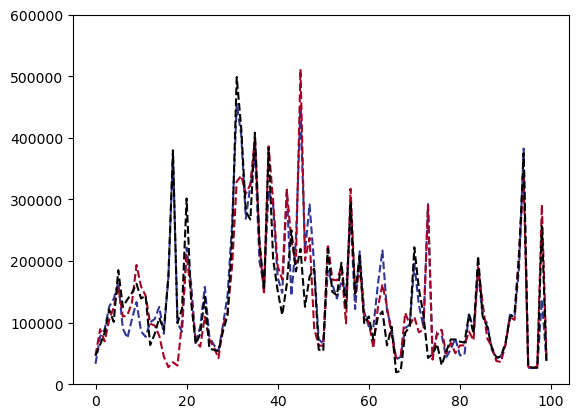

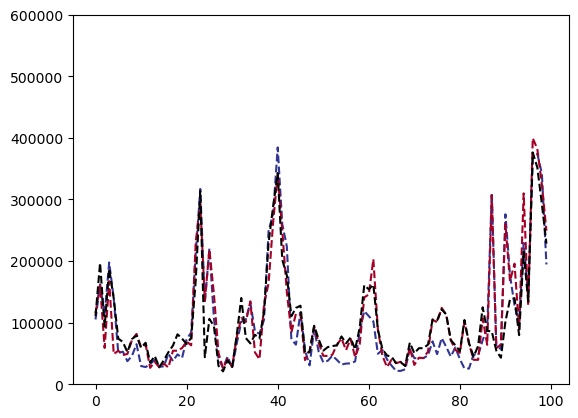

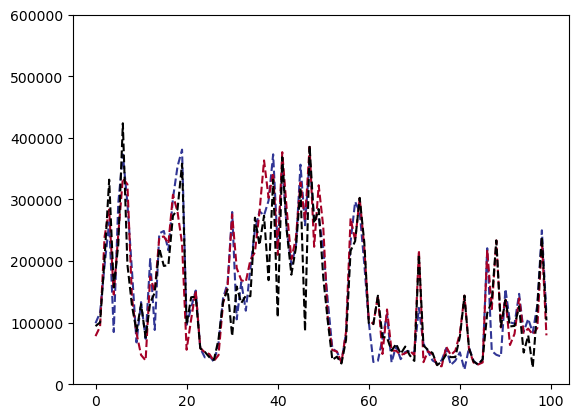

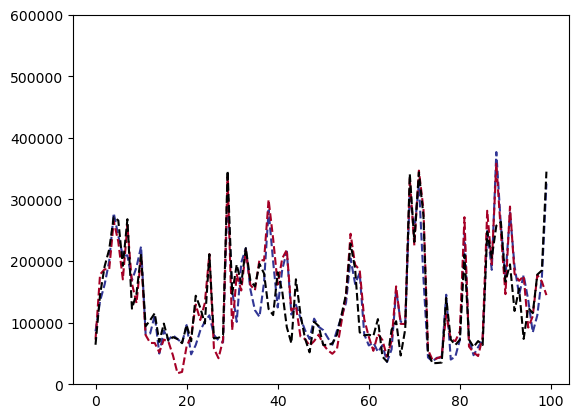

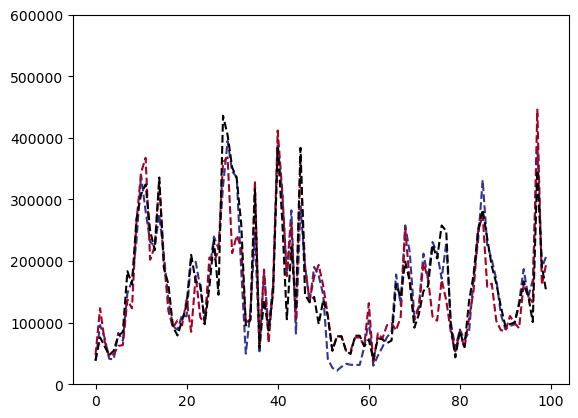

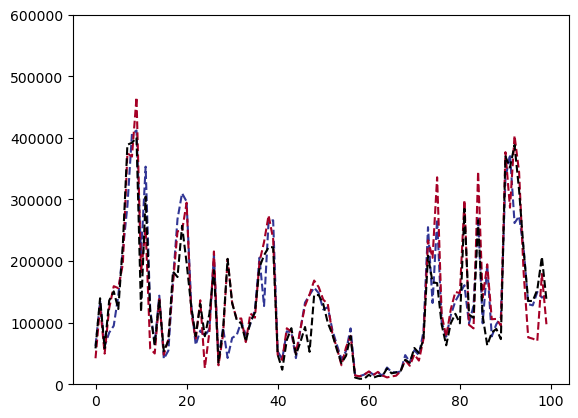

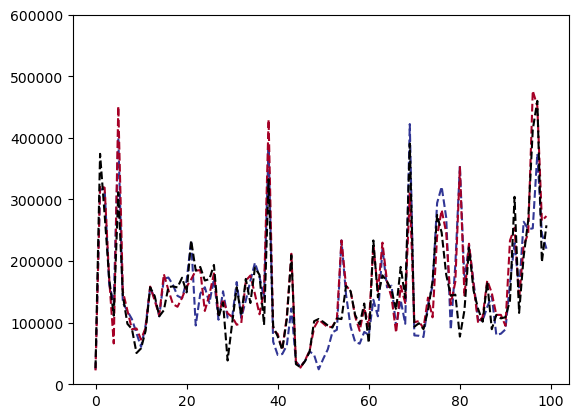

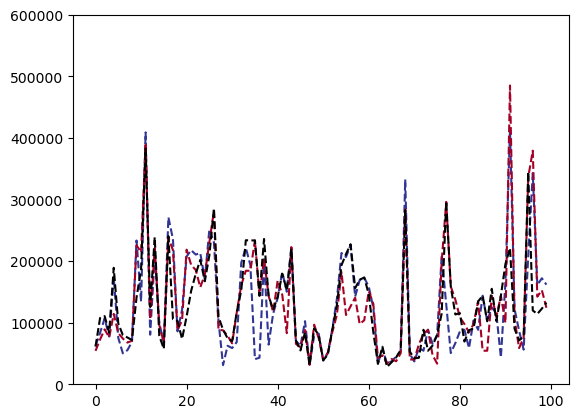

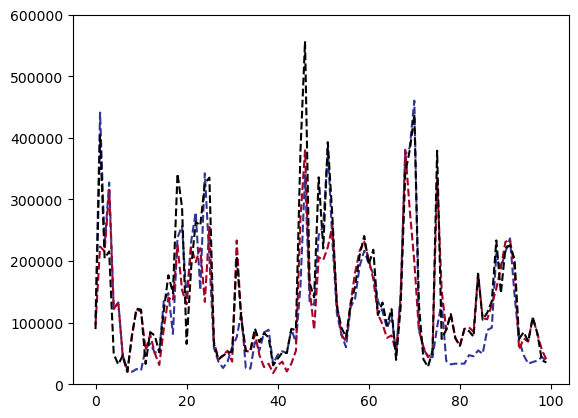

In [4]:
for folder in drum_folders:
    sampnums = [5000]
    files = [folder+'/out.{}.smc.gz'.format(num) for num in sampnums]
    region_start = int(folder.split('.')[4].split('_')[1])
    region_stop = int(folder.split('.')[4].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)
    len(positions)
    
    post_cd_heights = []
    post_cr_heights = []
    post_dr_heights = []
    
    for pos in positions:
        post_cd_heights_pos = []
        post_cr_heights_pos = []
        post_dr_heights_pos = []
        for file in files:
            f=gzip.open(file,'rt')
            names=f.readline().split()[1:]
            names_dict = dict(zip(range(len(names)),names))
            
            cusp_keys = np.array(list(range(len(names))))[[i.startswith('pcusp') for i in names_dict.values()]]
            drum_keys = np.array(list(range(len(names))))[[i.startswith('pdrum') for i in names_dict.values()]]
            roem_keys = np.array(list(range(len(names))))[[i.startswith('proe') for i in names_dict.values()]]
            
            f=gzip.open(file,'rt')
            for line in f.readlines():
                if line.startswith('TREE'):
                    linesplit = line.split()
                    if (pos>=int(linesplit[1])) & (pos<=int(linesplit[2])):
                        break
            newick = linesplit[3]
            
            t=toytree.tree(newick)
            
            cd_heights = []
            cr_heights = []
            dr_heights = []

            for ck in cusp_keys:
                for dk in drum_keys:
                    cd_heights.append(t.mod.prune(str(ck),str(dk)).treenode.height)
            for ck in cusp_keys:
                for rk in roem_keys:
                    cr_heights.append(t.mod.prune(str(ck),str(rk)).treenode.height)
            for dk in drum_keys:
                for rk in roem_keys:
                    dr_heights.append(t.mod.prune(str(dk),str(rk)).treenode.height)
            
            post_cd_heights_pos.append(cd_heights)
            post_cr_heights_pos.append(cr_heights)
            post_dr_heights_pos.append(dr_heights)
            
        post_cd_heights.append(post_cd_heights_pos)
        post_cr_heights.append(post_cr_heights_pos)
        post_dr_heights.append(post_dr_heights_pos)
    

    plt.plot(np.array(post_cd_heights)[:,0,:].mean(axis=1),
         color='#313695', linestyle='--')

    plt.plot(np.array(post_cr_heights)[:,0,:].mean(axis=1),
             color='#A50026', linestyle='--')
    
    plt.plot(np.array(post_dr_heights)[:,0,:].mean(axis=1),
             color='#000000', linestyle='--')  # same as 'k'

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/drum/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
blue = avg pairwise CD coalescence time  
red = avg pairwise CR coalescence time  

# roemeriana-cuspidata outlier windows

### Make a list of results folders

In [5]:
roem_folders = [i for i in os.listdir('./argweaver_runs') if 'roem' in i]

# one failed - remove it
roem_folders.remove('outlier_windows.shared.roem.1_1126000000_1126250000.rep1.DP_5.vcf.gz')

roem_folders = [os.path.join('./argweaver_runs', i) for i in roem_folders]

### Make plots of pairwise coalescence times between species

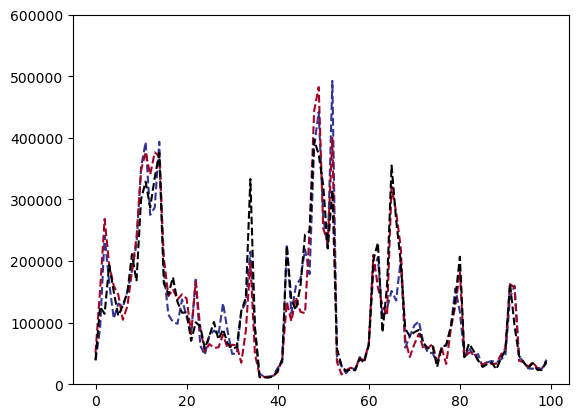

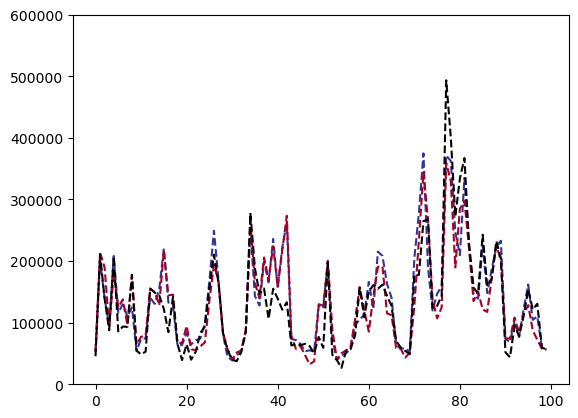

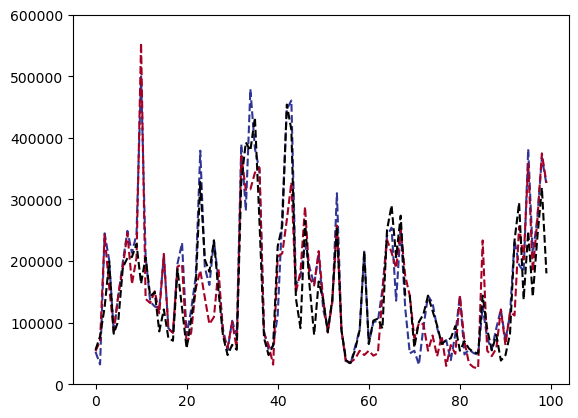

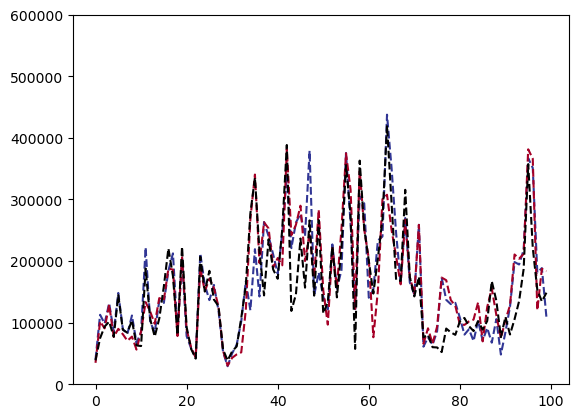

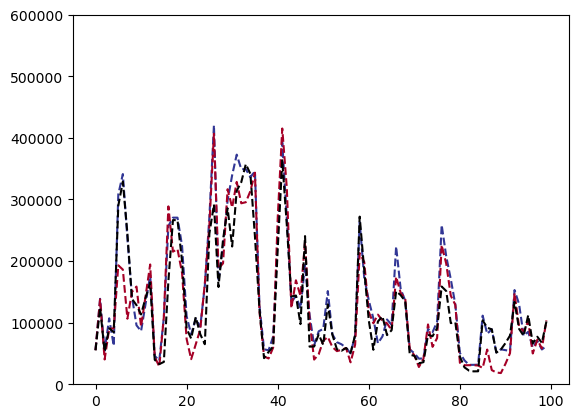

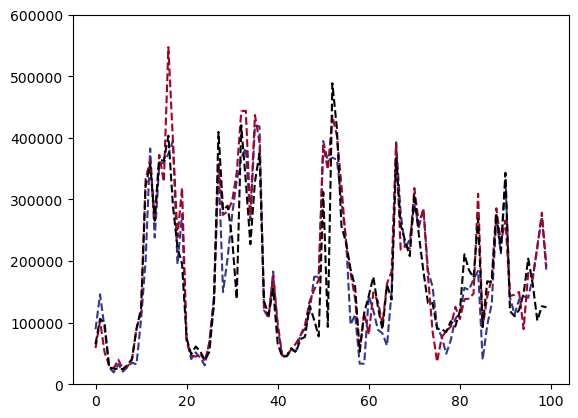

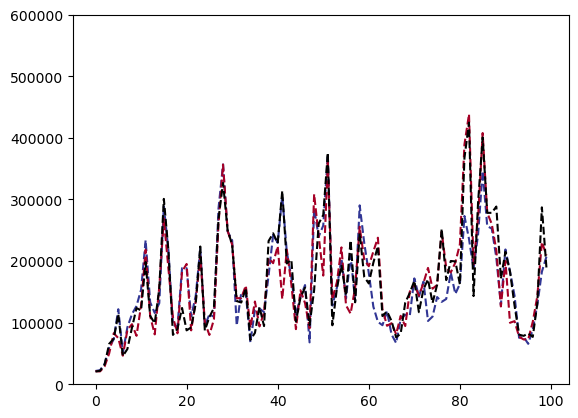

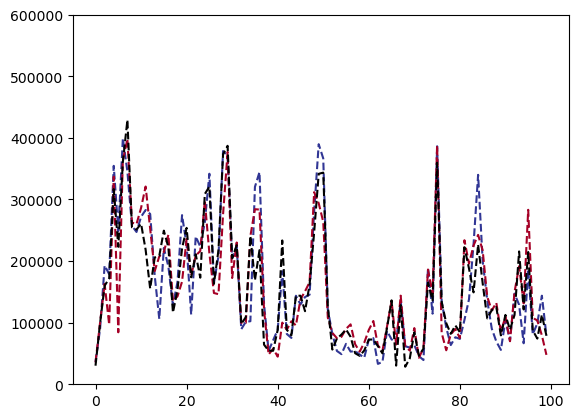

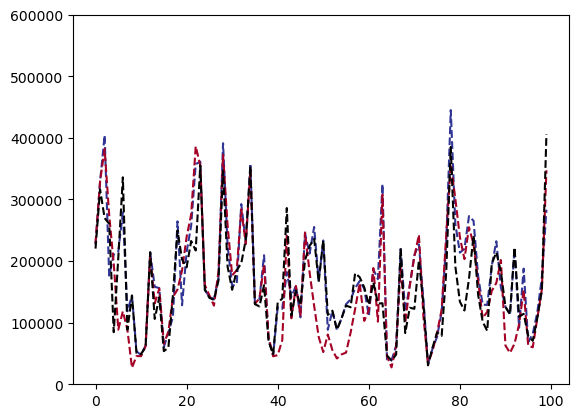

In [6]:
for folder in roem_folders:
    sampnums = [5000]
    files = [folder+'/out.{}.smc.gz'.format(num) for num in sampnums]
    region_start = int(folder.split('.')[4].split('_')[1])
    region_stop = int(folder.split('.')[4].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)
    len(positions)
    
    post_cd_heights = []
    post_cr_heights = []
    post_dr_heights = []

    for pos in positions:
        post_cd_heights_pos = []
        post_cr_heights_pos = []
        post_dr_heights_pos = []

        for file in files:
            f=gzip.open(file,'rt')
            names=f.readline().split()[1:]
            names_dict = dict(zip(range(len(names)),names))
            
            cusp_keys = np.array(list(range(len(names))))[[i.startswith('pcusp') for i in names_dict.values()]]
            drum_keys = np.array(list(range(len(names))))[[i.startswith('pdrum') for i in names_dict.values()]]
            roem_keys = np.array(list(range(len(names))))[[i.startswith('proe') for i in names_dict.values()]]
            
            f=gzip.open(file,'rt')
            for line in f.readlines():
                if line.startswith('TREE'):
                    linesplit = line.split()
                    if (pos>=int(linesplit[1])) & (pos<=int(linesplit[2])):
                        break
            newick = linesplit[3]
            
            t=toytree.tree(newick)
            
            cd_heights = []
            cr_heights = []
            dr_heights = []

            for ck in cusp_keys:
                for dk in drum_keys:
                    cd_heights.append(t.mod.prune(str(ck),str(dk)).treenode.height)
            for ck in cusp_keys:
                for rk in roem_keys:
                    cr_heights.append(t.mod.prune(str(ck),str(rk)).treenode.height)
            for dk in drum_keys:
                for rk in roem_keys:
                    dr_heights.append(t.mod.prune(str(dk),str(rk)).treenode.height)
            
            post_cd_heights_pos.append(cd_heights)
            post_cr_heights_pos.append(cr_heights)
            post_dr_heights_pos.append(dr_heights)
            
        post_cd_heights.append(post_cd_heights_pos)
        post_cr_heights.append(post_cr_heights_pos)
        post_dr_heights.append(post_dr_heights_pos)
    
    plt.plot(np.array(post_cd_heights)[:,0,:].mean(axis=1),
         color='#313695', linestyle='--')

    plt.plot(np.array(post_cr_heights)[:,0,:].mean(axis=1),
             color='#A50026', linestyle='--')
    
    plt.plot(np.array(post_dr_heights)[:,0,:].mean(axis=1),
             color='#000000', linestyle='--')  # same as 'k'

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/roem/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
blue = avg pairwise CD coalescence time  
red = avg pairwise CR coalescence time  

# Randomly sampled windows

In [7]:
samp_folders = [i for i in os.listdir('./argweaver_runs/samp_windows/') if "samp_windows" in i]

# some failed - remove them
samp_folders.remove('samp_windows.1_1088750000_1089000000.rep1.DP_5.vcf.gz')
samp_folders.remove('samp_windows.1_1103250000_1103500000.rep1.DP_5.vcf.gz')
samp_folders.remove('samp_windows.2_1010750000_1011000000.rep1.DP_5.vcf.gz')
samp_folders.remove('samp_windows.1_1101750000_1102000000.rep1.DP_5.vcf.gz')
samp_folders.remove('samp_windows.2_1134250000_1134500000.rep1.DP_5.vcf.gz')

samp_folders = [os.path.join('./argweaver_runs/samp_windows', i) for i in samp_folders]

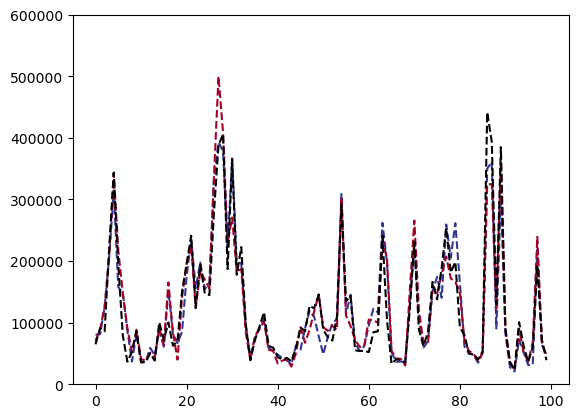

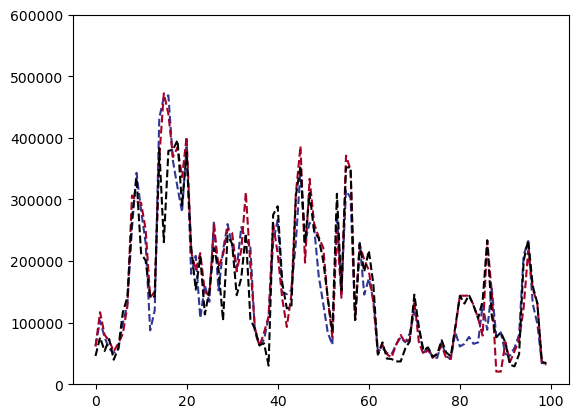

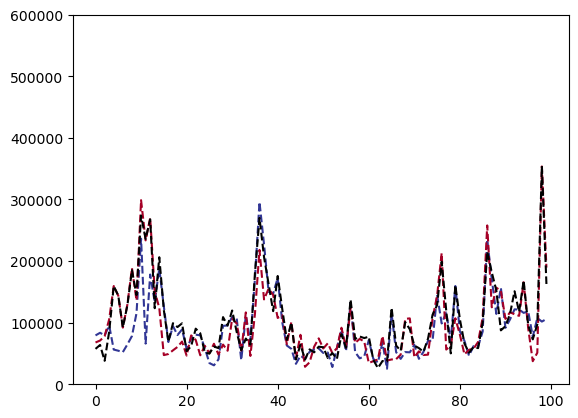

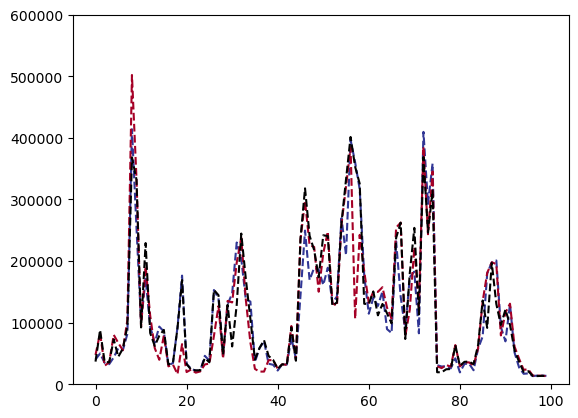

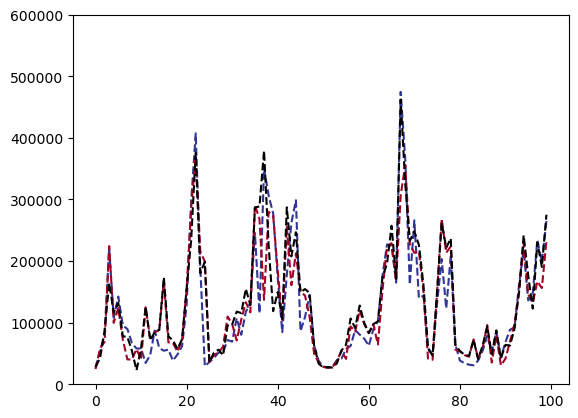

...

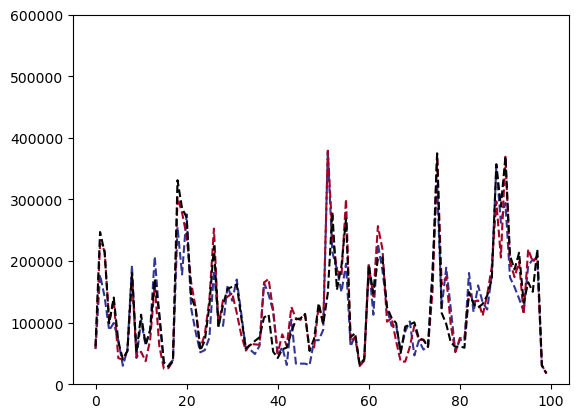

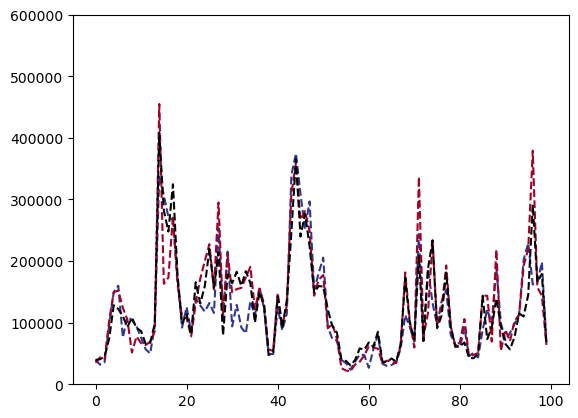

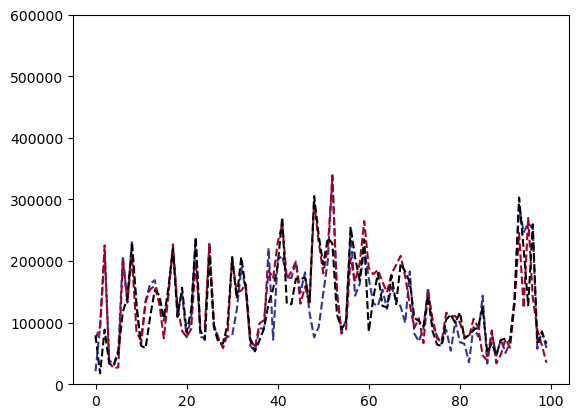

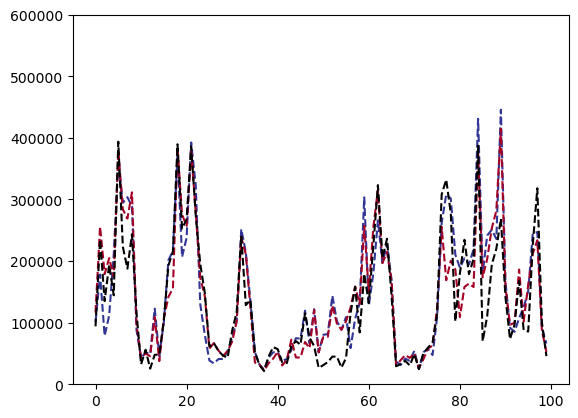

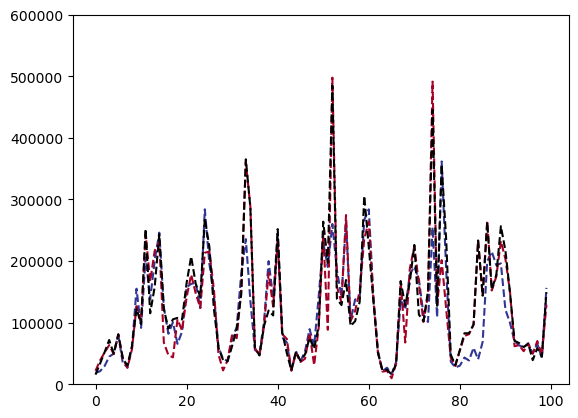

In [8]:
for folder in samp_folders:
    sampnums = [5000]
    files = [folder+'/out.{}.smc.gz'.format(num) for num in sampnums]
    region_start = int(folder.split('.')[2].split('_')[1])
    region_stop = int(folder.split('.')[2].split('_')[2])
    region = [region_start,region_stop]
    positions = range(region[0],region[1],2500)
    len(positions)
    
    post_cd_heights = []
    post_cr_heights = []
    post_dr_heights = []

    for pos in positions:
        post_cd_heights_pos = []
        post_cr_heights_pos = []
        post_dr_heights_pos = []

        for file in files:
            f=gzip.open(file,'rt')
            names=f.readline().split()[1:]
            names_dict = dict(zip(range(len(names)),names))
            
            cusp_keys = np.array(list(range(len(names))))[[i.startswith('pcusp') for i in names_dict.values()]]
            drum_keys = np.array(list(range(len(names))))[[i.startswith('pdrum') for i in names_dict.values()]]
            roem_keys = np.array(list(range(len(names))))[[i.startswith('proe') for i in names_dict.values()]]
            
            f=gzip.open(file,'rt')
            for line in f.readlines():
                if line.startswith('TREE'):
                    linesplit = line.split()
                    if (pos>=int(linesplit[1])) & (pos<=int(linesplit[2])):
                        break
            newick = linesplit[3]
            
            t=toytree.tree(newick)
            
            cd_heights = []
            cr_heights = []
            dr_heights = []
            for ck in cusp_keys:
                for dk in drum_keys:
                    cd_heights.append(t.mod.prune(str(ck),str(dk)).treenode.height)
            for ck in cusp_keys:
                for rk in roem_keys:
                    cr_heights.append(t.mod.prune(str(ck),str(rk)).treenode.height)
            for dk in drum_keys:
                for rk in roem_keys:
                    dr_heights.append(t.mod.prune(str(dk),str(rk)).treenode.height)
            
            post_cd_heights_pos.append(cd_heights)
            post_cr_heights_pos.append(cr_heights)
            post_dr_heights_pos.append(dr_heights)
            
        post_cd_heights.append(post_cd_heights_pos)
        post_cr_heights.append(post_cr_heights_pos)
        post_dr_heights.append(post_dr_heights_pos)
    
    plt.plot(np.array(post_cd_heights)[:,0,:].mean(axis=1),
         color='#313695', linestyle='--')

    plt.plot(np.array(post_cr_heights)[:,0,:].mean(axis=1),
             color='#A50026', linestyle='--')
    
    plt.plot(np.array(post_dr_heights)[:,0,:].mean(axis=1),
             color='#000000', linestyle='--')  # same as 'k'

    plt.ylim(ymin,ymax)
    
    plt.savefig(f"./plotting/args/samp/{folder.split('/')[-1][:-7]}.pdf", bbox_inches='tight')
    
    plt.show()

### Key: 
black = avg pairwise DR coalescence time  
blue = avg pairwise CD coalescence time  
red = avg pairwise CR coalescence time  

# Fst pixy vals

In [9]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/outlier_windows.shared.pixy.20260311.tar.gz"

df_list = []
for val in ['dxy','fst','pi']:
    member = f"results/outlier_windows/pixy/outlier_windows.shared.drum.1_869000000_869250000.rep1.DP_5_{val}.txt"
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

In [10]:
df_list[0]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_dxy,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,drum,1,869000000,869250000,0.021661,39895,29024,1339940,6343772
1,cusp,roem,1,869000000,869250000,0.031356,23005,21640,690144,5072640
2,cusp,pilo,1,869000000,869250000,0.027377,50305,13838,505452,1415476
3,drum,roem,1,869000000,869250000,0.034059,24190,23482,689452,5073332
4,drum,pilo,1,869000000,869250000,0.028924,51766,14168,489840,1431088
5,roem,pilo,1,869000000,869250000,0.031054,29157,8466,272624,1168072


In [11]:
df_list[1]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_wc_fst,no_snps
0,cusp,drum,1,869000000,869250000,0.048786,9021
1,cusp,roem,1,869000000,869250000,0.108792,9021
2,cusp,pilo,1,869000000,869250000,0.035424,9021
3,drum,roem,1,869000000,869250000,0.138241,9021
4,drum,pilo,1,869000000,869250000,0.105840,9021
5,roem,pilo,1,869000000,869250000,0.097902,9021


In [12]:
df_list[2]

,pop,chromosome,window_pos_1,window_pos_2,avg_pi,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,1,869000000,869250000,0.021206,50332,14235,671285,2690339
1,drum,1,869000000,869250000,0.019808,51781,12711,641723,2719901
2,roem,1,869000000,869250000,0.025594,29163,7289,284788,1516082
3,pilo,1,869000000,869250000,0.008390,120026,1007,120026,32


In [13]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/outlier_windows.shared.pixy.20260311.tar.gz"

df_list = []
for val in ['dxy','fst','pi']:
    member = f"results/outlier_windows/pixy/outlier_windows.shared.roem.5_177500000_177750000.rep1.DP_5_{val}.txt"
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

In [14]:
df_list[0]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_dxy,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,drum,5,177500000,177750000,0.039402,32594,43496,1103916,6604308
1,cusp,roem,5,177500000,177750000,0.028519,28743,18898,662636,5118532
2,cusp,pilo,5,177500000,177750000,0.035217,66726,22412,636400,1290656
3,drum,roem,5,177500000,177750000,0.037732,23063,20108,532912,5248256
4,drum,pilo,5,177500000,177750000,0.036120,38350,13878,384220,1542836
5,roem,pilo,5,177500000,177750000,0.031881,29543,6982,219004,1226288


In [15]:
df_list[1]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_wc_fst,no_snps
0,cusp,drum,5,177500000,177750000,0.090293,10703
1,cusp,roem,5,177500000,177750000,0.017935,10703
2,cusp,pilo,5,177500000,177750000,0.024133,10703
3,drum,roem,5,177500000,177750000,0.124414,10703
4,drum,pilo,5,177500000,177750000,0.123875,10703
5,roem,pilo,5,177500000,177750000,0.048348,10703


In [16]:
df_list[2]

,pop,chromosome,window_pos_1,window_pos_2,avg_pi,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,5,177500000,177750000,0.030725,66755,24043,782515,2589833
1,drum,5,177500000,177750000,0.029345,38351,14410,491056,2881292
2,roem,5,177500000,177750000,0.029406,29543,5446,185199,1621416
3,pilo,5,177500000,177750000,0.006660,120412,802,120412,29


In [17]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/samp_windows.pixy.20260311.tar.gz"

df_list = []
for val in ['dxy','fst','pi']:
    member = f"results/samp_windows/pixy/samp_windows.4_11250000_11500000.rep1.DP_5_{val}.txt"
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

In [18]:
df_list[0]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_dxy,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,drum,4,11250000,11500000,0.034445,35531,43488,1262544,6013360
1,cusp,roem,4,11250000,11500000,0.039125,40639,31486,804760,4652168
2,cusp,pilo,4,11250000,11500000,0.034709,68227,21976,633144,1185832
3,drum,roem,4,11250000,11500000,0.030323,29222,26436,871824,4585104
4,drum,pilo,4,11250000,11500000,0.031562,39935,14606,462768,1356208
5,roem,pilo,4,11250000,11500000,0.040481,55133,14758,364568,999664


In [19]:
df_list[1]

,pop1,pop2,chromosome,window_pos_1,window_pos_2,avg_wc_fst,no_snps
0,cusp,drum,4,11250000,11500000,0.063564,13486
1,cusp,roem,4,11250000,11500000,0.063463,13486
2,cusp,pilo,4,11250000,11500000,0.024739,13486
3,drum,roem,4,11250000,11500000,0.039358,13486
4,drum,pilo,4,11250000,11500000,0.097226,13486
5,roem,pilo,4,11250000,11500000,0.047620,13486


In [20]:
df_list[2]

,pop,chromosome,window_pos_1,window_pos_2,avg_pi,no_sites,count_diffs,count_comparisons,count_missing
0,cusp,4,11250000,11500000,0.034935,69615,26489,758247,2424961
1,drum,4,11250000,11500000,0.026496,39982,17983,678714,2504494
2,roem,4,11250000,11500000,0.032446,55179,9330,287552,1417738
3,pilo,4,11250000,11500000,0.006840,112274,768,112274,1412


# Re-make the violin plots

In [2]:
ymin = -0.25
ymax=0.25

In [3]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/outlier_windows.shared.pixy.20260311.tar.gz"

In [4]:
cmd = ["tar", "-tzf", archive]
with subprocess.Popen(cmd, stdout=subprocess.PIPE, text=True) as proc:
    output, _ = proc.communicate()
output=output.split()

In [5]:
fst_output = [i for i in output if i.endswith('fst.txt')]
drum_fst_output = [i for i in fst_output if 'drum' in i]
roem_fst_output = [i for i in fst_output if 'roem' in i]

In [6]:
drum_fst_output = [i for i in drum_fst_output if 'rep1' in i]
roem_fst_output = [i for i in roem_fst_output if 'rep1' in i]

In [7]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/outlier_windows.shared.pixy.20260311.tar.gz"

df_list = []
for member in drum_fst_output:
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

cd_list = []
cr_list = []
dr_list = []
for df_ in df_list:
    cd = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "drum")].avg_wc_fst.iloc[0]
    cr = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]
    dr = df_[(df_["pop1"] == "drum") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]

    cd_list.append(cd)
    cr_list.append(cr)
    dr_list.append(dr)

cd_list = np.array(cd_list)
cr_list = np.array(cr_list)
dr_list = np.array(dr_list)

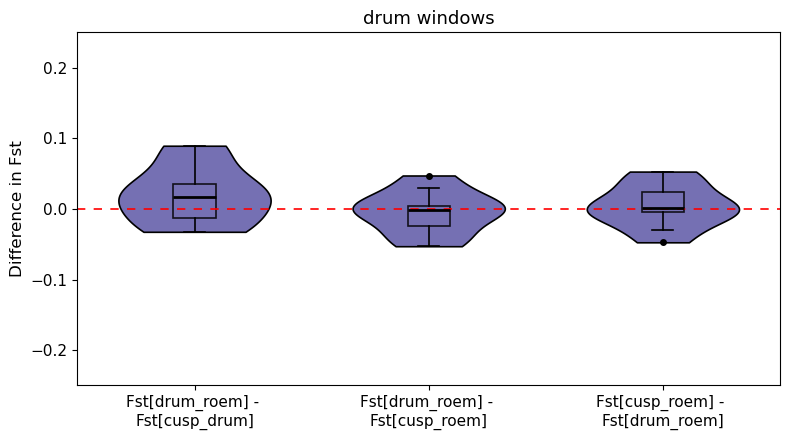

In [8]:
data = [dr_list-cd_list,dr_list-cr_list,cr_list-dr_list]

# hex cols
colors = ["#7570B3", "#7570B3", "#7570B3"]

labels = [
    "Fst[drum_roem] - \nFst[cusp_drum]",
    "Fst[drum_roem] - \nFst[cusp_roem]",
    "Fst[cusp_roem] - \nFst[drum_roem]"
]

fig, ax = plt.subplots(figsize=(8, 4.5))

# violins
vp = ax.violinplot(
    data,
    positions=[1, 2, 3],
    widths=0.65,
    showmeans=False,
    showmedians=False,
    showextrema=False
)

# violin colors
for body, color in zip(vp["bodies"], colors):
    body.set_facecolor(color)
    body.set_edgecolor("black")
    body.set_linewidth(1.2)
    body.set_alpha(1.0)

# boxplots on violins
bp = ax.boxplot(
    data,
    positions=[1, 2, 3],
    widths=0.18,
    patch_artist=True,
    showfliers=True,
    boxprops=dict(edgecolor="black", linewidth=1.2),
    whiskerprops=dict(color="black", linewidth=1.2),
    capprops=dict(color="black", linewidth=1.2),
    medianprops=dict(color="black", linewidth=2),
    flierprops=dict(marker='o', markersize=4, markerfacecolor='black', markeredgecolor='black')
)

ax.set_ylim(ymin, ymax)

for patch, color in zip(bp["boxes"], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.85)

# horiz line
ax.axhline(0, color="red", linestyle="--", linewidth=1.2, dashes=(5, 5))

# labels and title
ax.set_xticks([1, 2, 3])
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("drum windows", fontsize=13)

# y-label
ax.set_ylabel("Difference in Fst", fontsize=12)

# aes
ax.spines["top"].set_visible(True)
ax.spines["right"].set_visible(True)
ax.tick_params(axis='both', labelsize=11)

plt.tight_layout()

plt.savefig(f"./plotting/violins/drum_windows.pdf", bbox_inches='tight')

plt.show()

In [9]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/outlier_windows.shared.pixy.20260311.tar.gz"

df_list = []
for member in roem_fst_output:
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

cd_list = []
cr_list = []
dr_list = []
for df_ in df_list:
    cd = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "drum")].avg_wc_fst.iloc[0]
    cr = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]
    dr = df_[(df_["pop1"] == "drum") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]

    cd_list.append(cd)
    cr_list.append(cr)
    dr_list.append(dr)

cd_list = np.array(cd_list)
cr_list = np.array(cr_list)
dr_list = np.array(dr_list)

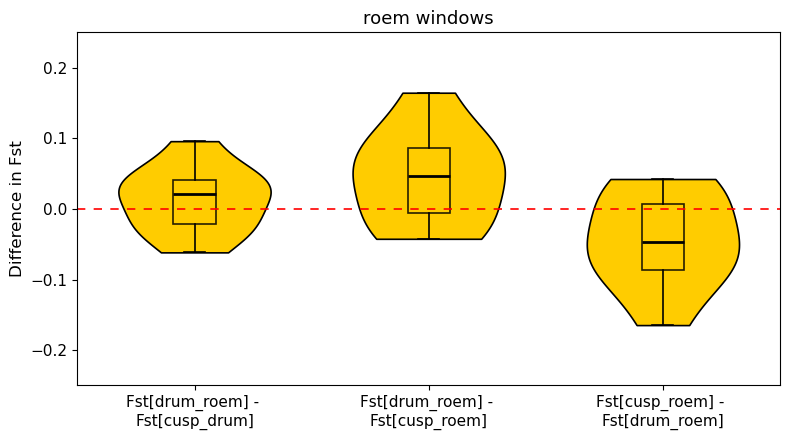

In [10]:
data = [dr_list-cd_list,dr_list-cr_list,cr_list-dr_list]

# hex cols
colors = ["#FFCC00", "#FFCC00", "#FFCC00"]

labels = [
    "Fst[drum_roem] - \nFst[cusp_drum]",
    "Fst[drum_roem] - \nFst[cusp_roem]",
    "Fst[cusp_roem] - \nFst[drum_roem]"
]

fig, ax = plt.subplots(figsize=(8, 4.5))

# violins
vp = ax.violinplot(
    data,
    positions=[1, 2, 3],
    widths=0.65,
    showmeans=False,
    showmedians=False,
    showextrema=False,
)

# violin colors
for body, color in zip(vp["bodies"], colors):
    body.set_facecolor(color)
    body.set_edgecolor("black")
    body.set_linewidth(1.2)
    body.set_alpha(1.0)

# boxplots on violins
bp = ax.boxplot(
    data,
    positions=[1, 2, 3],
    widths=0.18,
    patch_artist=True,
    showfliers=True,
    boxprops=dict(edgecolor="black", linewidth=1.2),
    whiskerprops=dict(color="black", linewidth=1.2),
    capprops=dict(color="black", linewidth=1.2),
    medianprops=dict(color="black", linewidth=2),
    flierprops=dict(marker='o', markersize=4, markerfacecolor='black', markeredgecolor='black')
)

ax.set_ylim(ymin, ymax)

for patch, color in zip(bp["boxes"], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.85)

# horiz line
ax.axhline(0, color="red", linestyle="--", linewidth=1.2, dashes=(5, 5))

# labels and title
ax.set_xticks([1, 2, 3])
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("roem windows", fontsize=13)

# y-label
ax.set_ylabel("Difference in Fst", fontsize=12)

# aes
ax.spines["top"].set_visible(True)
ax.spines["right"].set_visible(True)
ax.tick_params(axis='both', labelsize=11)

plt.tight_layout()

plt.savefig(f"./plotting/violins/roem_windows.pdf", bbox_inches='tight')

plt.show()

# sample windows

In [11]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/samp_windows.pixy.20260311.tar.gz"

In [12]:
cmd = ["tar", "-tzf", archive]
with subprocess.Popen(cmd, stdout=subprocess.PIPE, text=True) as proc:
    output, _ = proc.communicate()
output=output.split()

In [13]:
fst_output = [i for i in output if i.endswith('fst.txt')]

In [14]:
samp_fst_output = [i for i in fst_output if 'rep1' in i]

In [15]:
archive = "/n/holylfs05/LABS/hopkins_lab/Lab/PROJECTS/Phlox_assembly_collab/args_introgression/samp_windows.pixy.20260311.tar.gz"

df_list = []
for member in samp_fst_output:
    cmd = ["tar", "-xzf", archive, member, "-O"]
    with subprocess.Popen(cmd, stdout=subprocess.PIPE) as proc:
        df = pd.read_csv(proc.stdout, sep="\t")
    df_list.append(df)

cd_list = []
cr_list = []
dr_list = []
for df_ in df_list:
    cd = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "drum")].avg_wc_fst.iloc[0]
    cr = df_[(df_["pop1"] == "cusp") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]
    dr = df_[(df_["pop1"] == "drum") & (df_["pop2"] == "roem")].avg_wc_fst.iloc[0]

    cd_list.append(cd)
    cr_list.append(cr)
    dr_list.append(dr)

cd_list = np.array(cd_list)
cr_list = np.array(cr_list)
dr_list = np.array(dr_list)

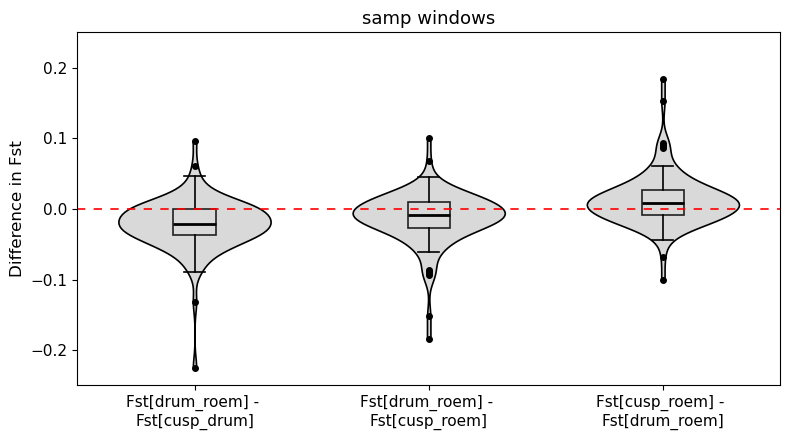

In [16]:
data = [dr_list-cd_list,dr_list-cr_list,cr_list-dr_list]

# hex cols
colors = ["#D9D9D9", "#D9D9D9", "#D9D9D9"]

labels = [
    "Fst[drum_roem] - \nFst[cusp_drum]",
    "Fst[drum_roem] - \nFst[cusp_roem]",
    "Fst[cusp_roem] - \nFst[drum_roem]"
]

fig, ax = plt.subplots(figsize=(8, 4.5))

# violins
vp = ax.violinplot(
    data,
    positions=[1, 2, 3],
    widths=0.65,
    showmeans=False,
    showmedians=False,
    showextrema=False,
)

# violin colors
for body, color in zip(vp["bodies"], colors):
    body.set_facecolor(color)
    body.set_edgecolor("black")
    body.set_linewidth(1.2)
    body.set_alpha(1.0)

# boxplots on violins
bp = ax.boxplot(
    data,
    positions=[1, 2, 3],
    widths=0.18,
    patch_artist=True,
    showfliers=True,
    boxprops=dict(edgecolor="black", linewidth=1.2),
    whiskerprops=dict(color="black", linewidth=1.2),
    capprops=dict(color="black", linewidth=1.2),
    medianprops=dict(color="black", linewidth=2),
    flierprops=dict(marker='o', markersize=4, markerfacecolor='black', markeredgecolor='black')
)

ax.set_ylim(ymin, ymax)

for patch, color in zip(bp["boxes"], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.85)

# horiz line
ax.axhline(0, color="red", linestyle="--", linewidth=1.2, dashes=(5, 5))

# labels and title
ax.set_xticks([1, 2, 3])
ax.set_xticklabels(labels, fontsize=11)
ax.set_title("samp windows", fontsize=13)

# y-label
ax.set_ylabel("Difference in Fst", fontsize=12)

# aes
ax.spines["top"].set_visible(True)
ax.spines["right"].set_visible(True)
ax.tick_params(axis='both', labelsize=11)

plt.tight_layout()

plt.savefig(f"./plotting/violins/samp_windows.pdf", bbox_inches='tight')

plt.show()